# Assignment 1:  Superpixels and Image Segmentation.

Name: **Vinay Krishna Bukka**

UID:  **118176680**

Link to Google Drive : https://colab.research.google.com/drive/1MTnsLBDcU1A3nxQKTKdfYdFN5Qcdb1zv?usp=sharing

Please submit a PDF containing all outputs to gradescope by **October 5, 11:59pm**

----------------------------

In this assignment, you will learn about superpixels. You will first generate superpixels by clustering pixels via k-means. This will generate a superpixel map such as the following:

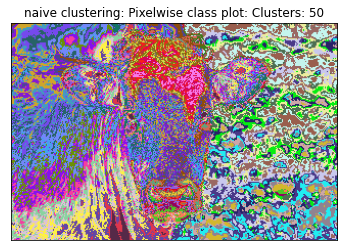

You will then implement a better superpixel algorithm: SLIC, which lets you generate superpixel maps like the following:

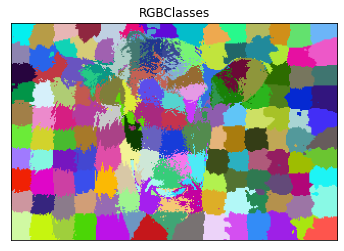

You will then build a segmentation network by training a deep neural network on your superpixels. This part is fairly open-ended, feel free to try any model you can think of (GNN, CNN, Transformer, etc.).

To give an example, for a CNN-based system that reformulates segmentation as superpixel image classification, there are basically three steps in the training stage:

1. Dilate and save each superpixel region from SLIC output into image of size 224X224, alongwith the ground truth segments label.
2. Build a couple of convolution layers to extract the deep features from each Superpixel patch image. Let the last layer be Fully connected layers.
3. Define the segmentation loss as multi-class classification loss and train a convolutional neural network based classifier.

Then, during inference, you would combine the classifier's predicted labels to form the whole input image's Superpixel segmentation results.

## Part 1: Superpixels

For this first part of the assignment, you will implement 2 superpixels methods: k-means pixel clustering, and SLIC.

### Data

First, we download the MSRC labeled imaged database.

In [ ]:
!wget http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
!unzip --qq msrc_objcategimagedatabase_v1.zip

--2023-10-07 03:32:15--  http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.36.48.252, 2600:1413:b000:78a::317f, 2600:1413:b000:793::317f
Connecting to download.microsoft.com (download.microsoft.com)|23.36.48.252|:80... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip [following]
--2023-10-07 03:32:15--  https://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
Connecting to download.microsoft.com (download.microsoft.com)|23.36.48.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 44119839 (42M) [application/octet-stream]
Saving to: ‘msrc_objcategimagedatabase_v1.zip’

msrc_objcategimaged 100%[===================>]  42.08M   1

For the first part of this assignment, we will only use the following images. We define the list below as `im_list`.

In [ ]:
im_list = ['MSRC_ObjCategImageDatabase_v1/1_22_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/1_27_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_3_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_6_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/6_5_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/7_19_s.bmp']

We provide the following functions as helpers for plotting your results. Please pay attention to their signatures and outputs.





In [ ]:
#All important functions to plot
%matplotlib inline
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

def plot_image(im, title, xticks = [], yticks = [], isCv2 = True):
    """
    im :Image to plot
    title : Title of image
    xticks : List of tick values. Defaults to nothing
    yticks :List of tick values. Defaults to nothing
    cv2 :Is the image cv2 image? cv2 images are BGR instead of RGB. Default True
    """
    plt.figure()
    if isCv2:
        im = im[:,:,::-1]
    plt.imshow(im)
    plt.title(title)
    plt.xticks(xticks)
    plt.yticks(yticks)

def superpixel_plot(im,seg,title = "Superpixels"):
    """
    Given an image (nXmX3) and pixelwise class mat (nXm),
    1. Consider each class as a superpixel
    2. Calculate mean superpixel value for each class
    3. Replace the RGB value of each pixel in a class with the mean value

    Inputs:
    im: Input image
    seg: Segmentation map
    title: Title of the plot

    Output: None
    Creates a plot
    """
    clust = np.unique(seg)
    mapper_dict = {i: im[seg == i].mean(axis = 0)/255. for i in clust}

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i]

    plot_image(seg_img,title)

    return

def rgb_segment(seg,n = None,plot = True,title=None,legend = True,color = None):
    """
    Given a segmentation map, get the plot of the classes
    """
    clust = np.unique(seg)
    if n is None:
        n = len(clust)
    if color is None:
        cm = plt.cm.get_cmap('hsv',n+1)
        # mapper_dict = {i:np.array(cm(i/n)) for i in clust}
        mapper_dict = {i:np.random.rand(3,) for i in clust}
    #elif color == 'mean':
        #TODO..get the mean color of cluster center and assign that to mapper_dict

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i][:3]

    if plot:
        plot_image(seg_img,title = title)
    if legend:
        # get the colors of the values, according to the
        # colormap used by imshow
        patches = [ mpatches.Patch(color=mapper_dict[i], label=" : {l}".format(l=i) ) for i in range(n) ]
        # put those patched as legend-handles into the legend
        plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0. )
        plt.grid(True)
        plt.show()

    return seg_img

For example, the following code uses `plot_image` to plot the 6 images we are using for this assignment.

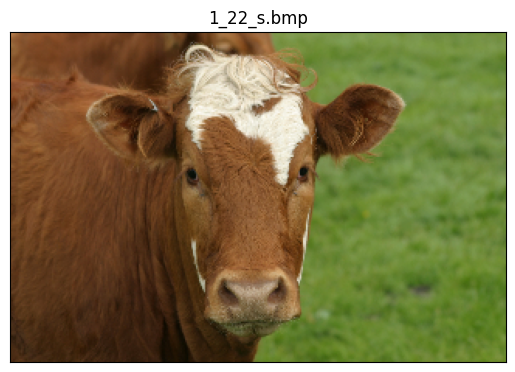

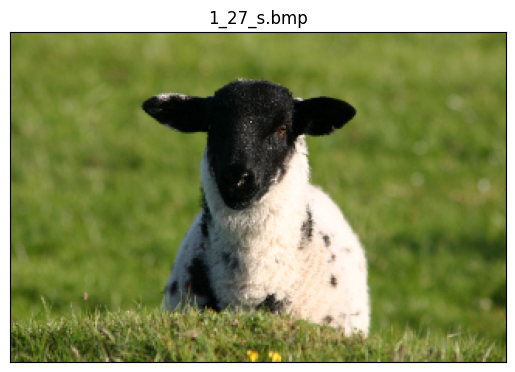

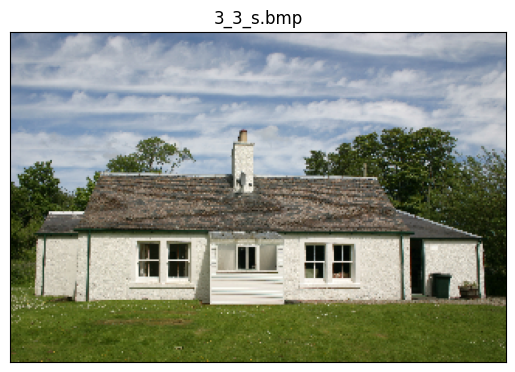

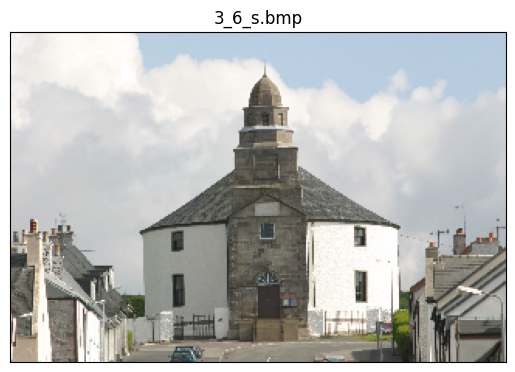

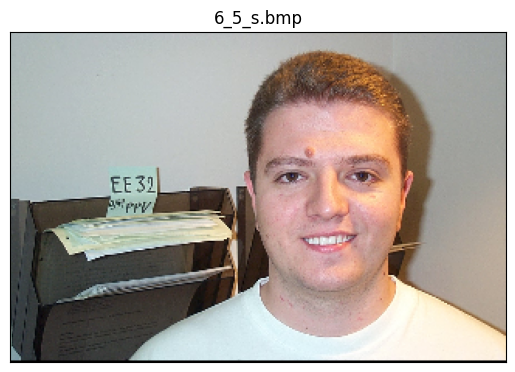

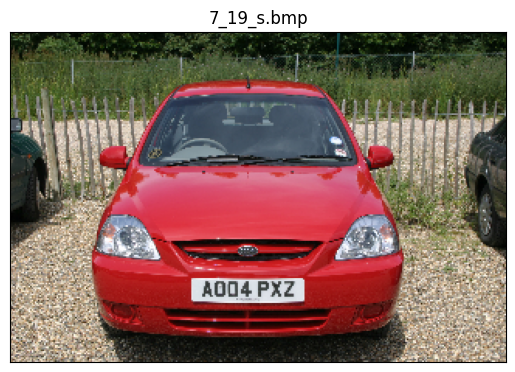

In [ ]:
for i in im_list:
    plot_image(cv2.imread(i),i.split("/")[-1])

### Question 1: Perform k-means on image pixels `(r, g, b, x, y)`. (40 points)

The k-means clustering algorithm is an unsupervised algorithm which, for some items and for some specified number of clusters represented by cluster centers, minimizes the distance between items and their associated cluster centers. It does so by iteratively assigning items to a cluster and recomputing the cluster center based on the assigned items.

Complete the pixel clustering function. It should take input an image (shape = `(n, m, 3)`) and number of clusters. Each pixel should be represented by a vector with 3 values: `(r, g, b, x, y)`.

Then, let our provided code plot the pixelwise and superpixel plots for the cow image (`1_22_s.bmp`), using your `cluster_pixels` implementation with the provided values for the number of clusters: `5, 10, 25, 50, 150`.




<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed tw

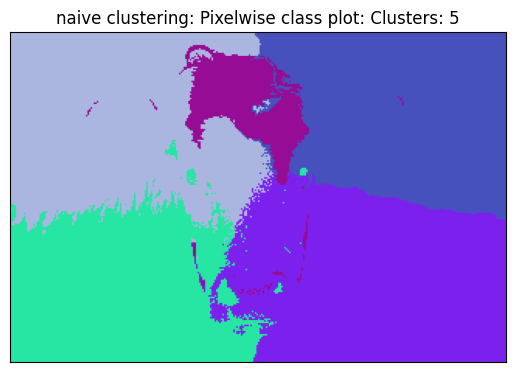

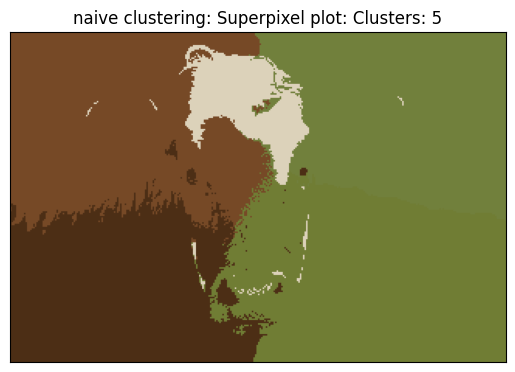

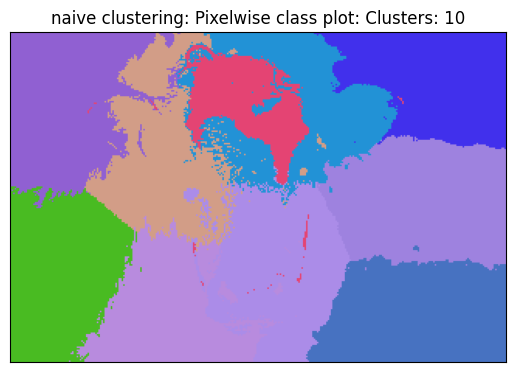

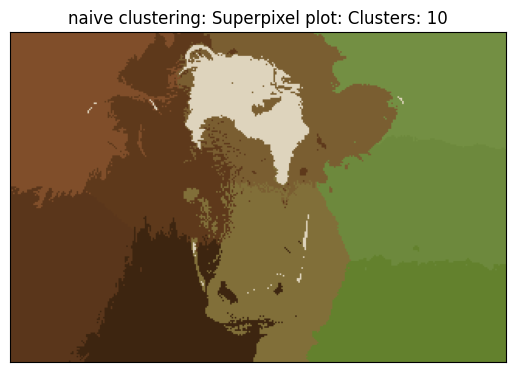

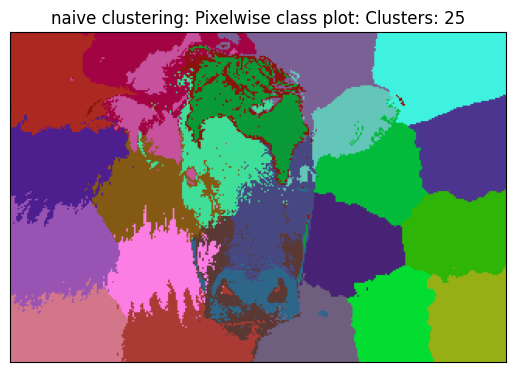

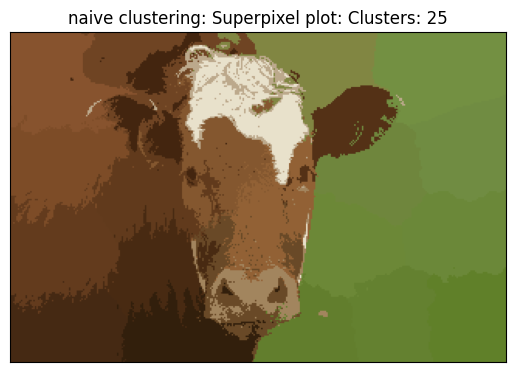

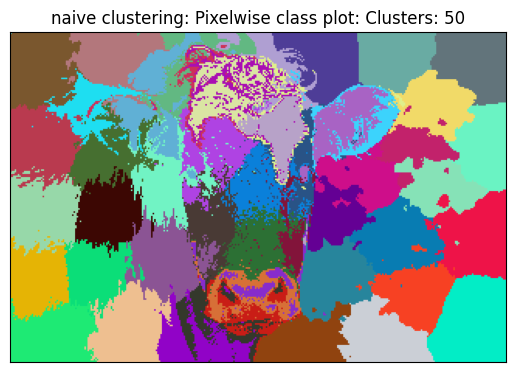

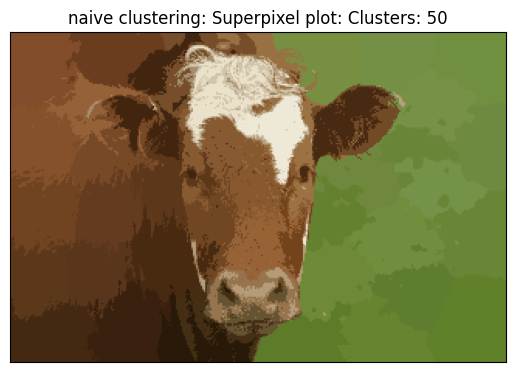

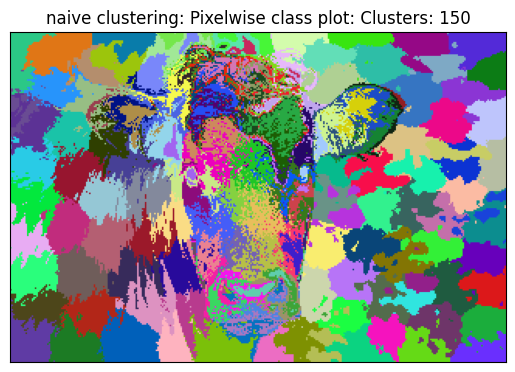

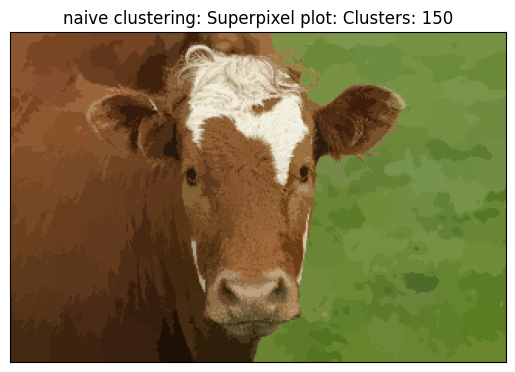

In [ ]:
from sklearn.cluster import KMeans
import numpy as  np
import cv2
import copy
def cluster_rgbxy(im,k):
    """
    Given image im and asked for k clusters, return nXm size 2D array
    segmap[0,0] is the class of pixel im[0,0,:]
    """
    # assert 1==2," NOT IMPLEMENTED"
    rows,columns,channels = im.shape
    pixel_reshape = np.zeros((rows*columns, 5), dtype = np.float32)
    for i in range(rows):
      for j in range(columns):
        pixel_ij = im[i,j]
        # Here we are storing the each pixel value in (r,g,b,x,y) in each row of pixel_reshape.
        # i*columns represent the current row in the image with offset as the first j rows in pixel_reshape represent the pixels value of first row in original image.
        pixel_reshape[i*columns+j] = [pixel_ij[2],pixel_ij[1],pixel_ij[0],i,j]
    # print(pixel_reshape.shape)
    img_flatten = im.reshape((-1,3))
    # print(img_flatten.shape)
    img_flatten = np.float32(img_flatten)
    kmeans = KMeans(n_clusters=k, random_state=0, n_init="auto").fit(pixel_reshape)
    labels = kmeans.labels_
    labels = labels.reshape((rows,columns))
    segmap = labels
    #segmap is nXm. Each value in the 2D array is the cluster assigned to that pixel
    return segmap

im = cv2.imread(im_list[0])
#[5, 10, 25, 50, 150]
for k in [5, 10, 25, 50, 150]:
    clusters = cluster_rgbxy(im,k)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

Pick your favorite superpixel **k** value and plot results for all 6 images in `im_list`.

<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed tw

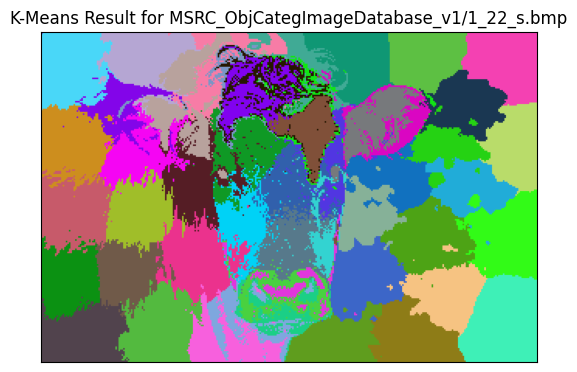

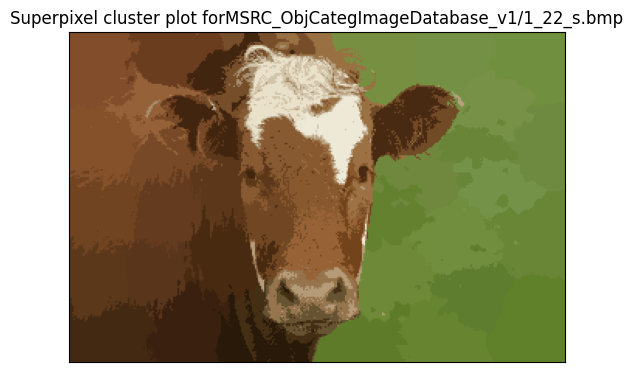

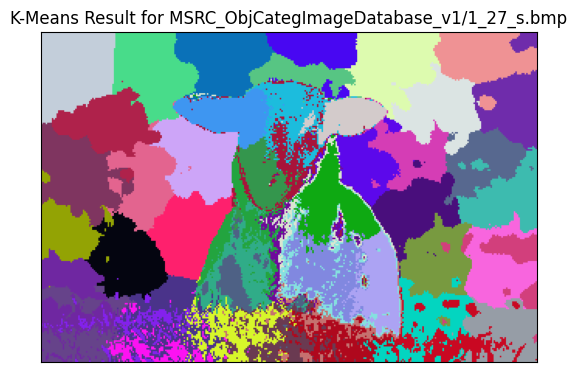

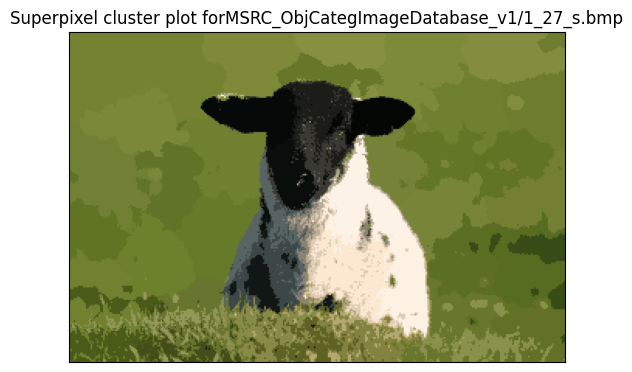

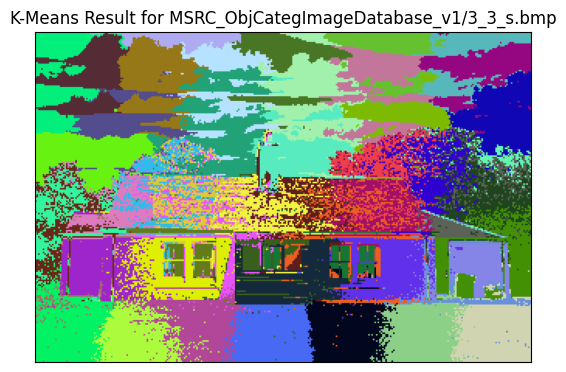

...

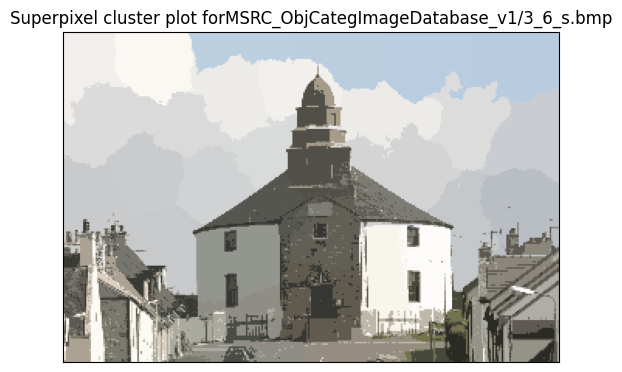

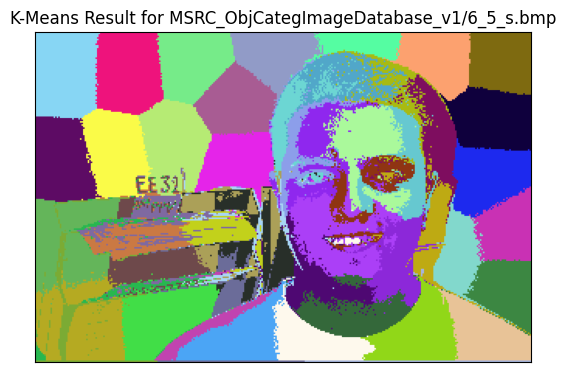

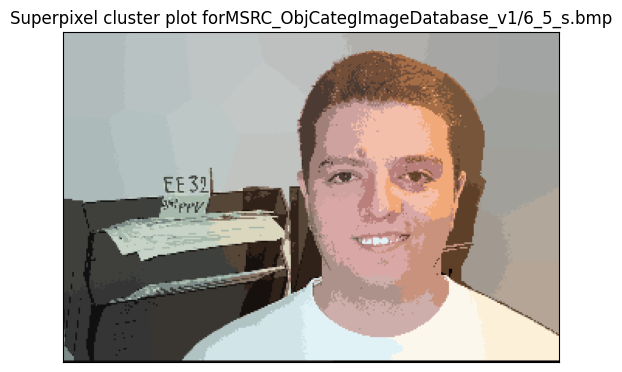

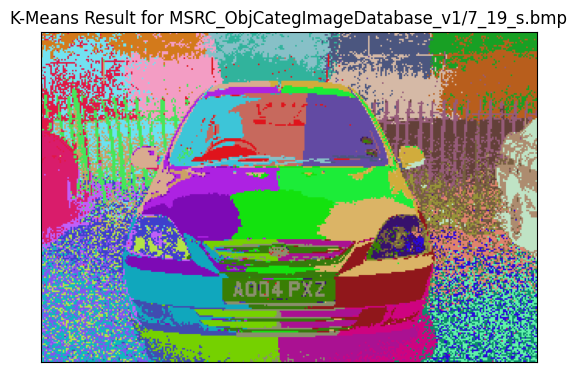

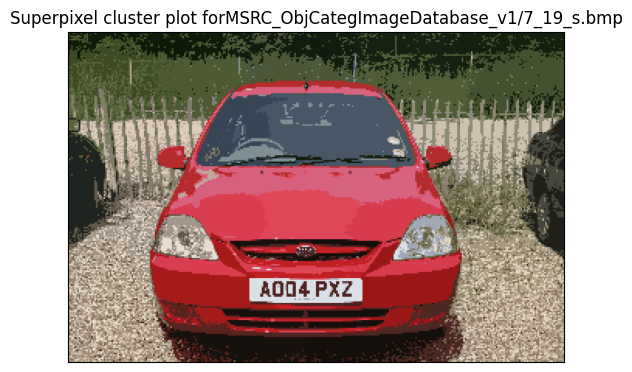

In [ ]:
# TODO: plot for 6 images with chosen k value
# TODO: plot for 6 images with chosen k value

fav_k = 50
for i in im_list:
    im = cv2.imread(i)
    clusters = cluster_rgbxy(im,fav_k)
    _ = rgb_segment(clusters,n = fav_k, title =  "K-Means Result for " + str(i),legend = False)
    superpixel_plot(im,clusters,title =  "Superpixel cluster plot for"+ str(i))

### Question 2: Replicate SLIC and Show Results for 6 Images (50 points)

It doesn't look like we have a very favourable outcome with superpixels being implemented with simple clustering. Can we do better? Have a look at the SLIC paper [here](https://www.iro.umontreal.ca/~mignotte/IFT6150/Articles/SLIC_Superpixels.pdf). Incorporate S and m and redefine your distance metric as per the paper.

**Finding an existing implementation of SLIC and using it for your assigment would be considered cheating.**

<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)


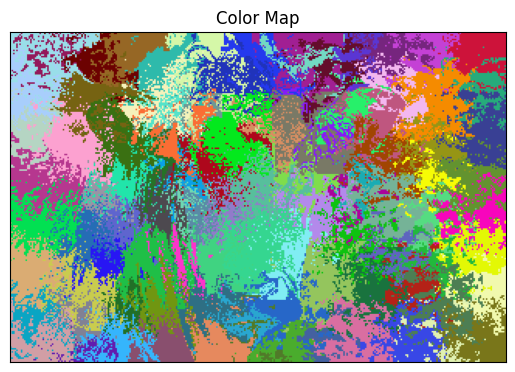

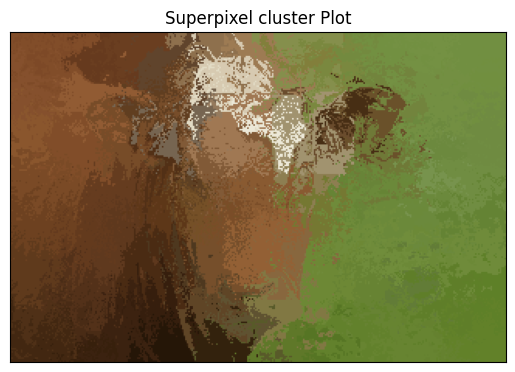

In [ ]:
############Algorithm############
#Compute grid steps: S
#you can explore different values of m
#initialize cluster centers [l,a,b,x,y] using
#Perturb for minimum G
#while not converged
##for every pixel:
####  compare distance D_s with each cluster center within 2S X 2S.
####  Assign to nearest cluster
##calculate new cluster center
import time
import copy

'''
The below function is used to update the cluster centers by
taking pixels around each cluster center and finding the mean among the
pixels.
'''
def update_cluster_centers(cluster_centers,pixel_id,lab_image):
  pixel_list = []
  for i in range(len(cluster_centers)):
    c_i = cluster_centers[i]
    a = np.argwhere(pixel_id == i)
    if(a.size > 0):
      mean = np.nanmean(a,axis=0)
      new_x,new_y = int(mean[0]),int(mean[1])
      cluster_centers[i][0],cluster_centers[i][1],cluster_centers[i][2],cluster_centers[i][3],cluster_centers[i][4] = lab_image[new_x,new_y][0],lab_image[new_x,new_y][1] ,lab_image[new_x,new_y][2], new_x , new_y
  return cluster_centers

def SLIC(im, k):
    """
    Input arguments:
    im: image input
    k: number of cluster segments


    Compute
    S: As described in the paper
    m: As described in the paper (use the same value as in the paper)
    follow the algorithm..

    returns:
    segmap: 2D matrix where each value corresponds to the image pixel's cluster number
    """
    # Converting image into LAB space
    lab_image = cv2.cvtColor(im,cv2.COLOR_BGR2LAB)
    image_copy = copy.deepcopy(lab_image)
    rows,columns,channels = lab_image.shape
    N = rows*columns
    m = 10
    # Size of each super pixel
    size = N//k
    # Pixel center/ length of each super pixel
    S = int(np.sqrt(N//k))
    cluster_centers = []
    for i in range(S//2,rows,S):
      for j in range(S//2,columns,S):
        l_i , a_i ,b_i = lab_image[i,j]
        cluster_centers.append([l_i , a_i ,b_i,i,j])
    '''
    1) Finding the gradients across the lab image for kernel sizes of 3
    2) for each cluster center
      a) Taking a window of 3x3 from gradients of image computed through sobel operator
      b) Computing the magnitude of this window gradient across all channels using L2 norm
      c) Finding the minimum gradient and updating the cluster center corresponding to minimum gradient.
    '''
    sobelx = cv2.Sobel(lab_image,cv2.CV_64F,1,0,ksize=3)
    sobely = cv2.Sobel(lab_image,cv2.CV_64F,0,1,ksize=3)
    for i in range(len(cluster_centers)):
      c_i = cluster_centers[i]
      # print(c_i)
      x,y = int(cluster_centers[i][3]), int(cluster_centers[i][4])
      # Taking a 3x3 neigbhourhood around x,y which is the center
      window_x = sobelx[x-1:x+2,y-1:y+2,:]
      window_y = sobely[x-1:x+2,y-1:y+2,:]
      # window_x = cv2.Sobel(window_x,cv2.CV_64F,1,0,ksize=3)
      # window_y = cv2.Sobel(window_y,cv2.CV_64F,0,1,ksize=3)
      gradient_i_magnitude = np.sqrt(window_x**2 + window_y**2)
      min_gradient = np.unravel_index(gradient_i_magnitude.argmin(), gradient_i_magnitude.shape)
      new_x = x+ min_gradient[1] - 1
      new_y = y+ min_gradient[2] - 1
      # print("Updated",lab_image[new_x ,new_y][0], lab_image[new_x ,new_y][1], lab_image[new_x ,new_y][2], new_x , new_y)
      cluster_centers[i][0],cluster_centers[i][1],cluster_centers[i][2],cluster_centers[i][3],cluster_centers[i][4] = lab_image[new_x ,new_y][0], lab_image[new_x ,new_y][1], lab_image[new_x ,new_y][2], new_x , new_y
    count = 0
    pixel_ids = []
    pixel_dict = {}
    pixel_id = np.full((rows,columns),np.inf)
    while (count < 15):
      for label in range(len(cluster_centers)):
        c_i = cluster_centers[label]
        # Attributes of the cluster center i, which are color values and location
        c_i_l,c_i_a,c_i_b,x,y = c_i[0],c_i[1],c_i[2],int(c_i[3]),int(c_i[4])
        # Making a window of size of 2S X 2S
        windows_size_x_L = x-S
        if windows_size_x_L < 0:
          windows_size_x_L = 0
        windows_size_x_H = x + S + 1
        if windows_size_x_H > rows:
          windows_size_x_H = rows
        windows_size_y_L = y - S
        if windows_size_y_L < 0:
          windows_size_y_L = 0
        windows_size_y_H = y + S +1
        if windows_size_y_H > columns:
          windows_size_y_H = columns
        for w_x in range(windows_size_x_L,windows_size_x_H):
          for w_y in range(windows_size_y_L,windows_size_y_H):
            current_pixel_l,current_pixel_a,current_pixel_b = lab_image[w_x,w_y][0],lab_image[w_x,w_y][1],lab_image[w_x,w_y][2]
            current_pixel_array = np.array([current_pixel_l,current_pixel_a,current_pixel_b])
            lab_array = np.array([c_i_l,c_i_a,c_i_b])
            lab_distance = np.linalg.norm(lab_array-current_pixel_array)
            # lab_distance = np.sqrt((c_i_l-current_pixel_l)**2+(current_pixel_a-c_i_a)**2+(current_pixel_b-c_i_b)**2)
            xy_distance =  np.sqrt((x-w_x)**2+(y-w_y)**2)
            d_s = lab_distance + ((m/S)* xy_distance)
            if (w_x,w_y) not in pixel_dict.keys():
              pixel_dict[(w_x,w_y)] = [int(label),d_s]
              pixel_id[w_x,w_y] = int(label)
            else:
              current_distance = pixel_dict[(w_x,w_y)][1]
              if(d_s < current_distance):
                pixel_dict[(w_x,w_y)][1] = d_s
                pixel_dict[(w_x,w_y)][0] = int(label)
                pixel_id[w_x,w_y] = int(label)
      cluster_centers = update_cluster_centers(cluster_centers,pixel_id,lab_image)
      count+=1
      pixel_ids.append(pixel_id)

    return pixel_id
# Initializing with K =  50. May tune it later
fav_k = 100
im = cv2.imread(im_list[0])
segmap = SLIC(im,fav_k)
_ = rgb_segment(segmap,n = fav_k, title =  "Color Map" ,legend = False)
superpixel_plot(im,segmap,title =  "Superpixel cluster Plot")

With SLIC implemented, plot results for all 6 images.

<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)


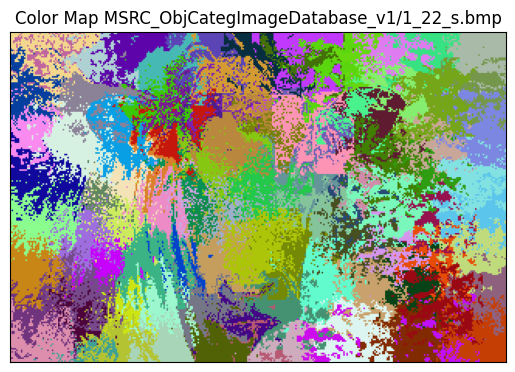

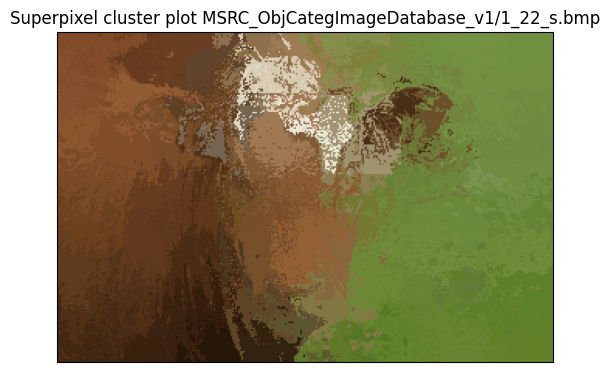

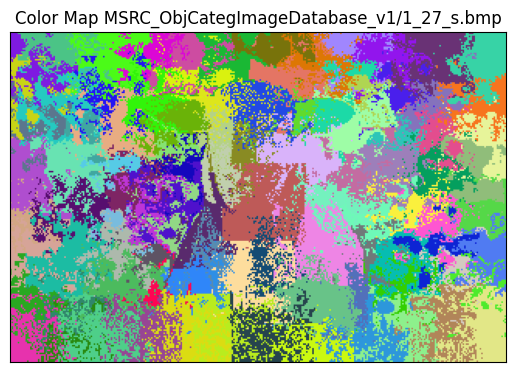

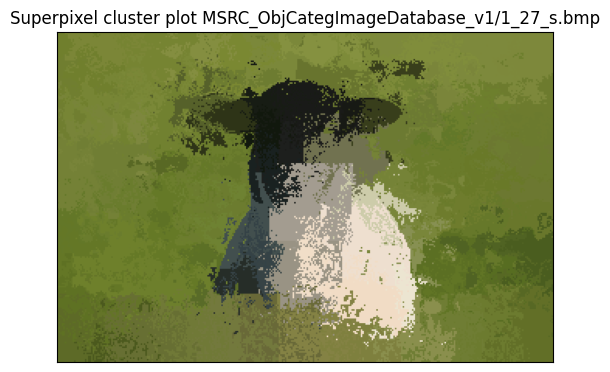

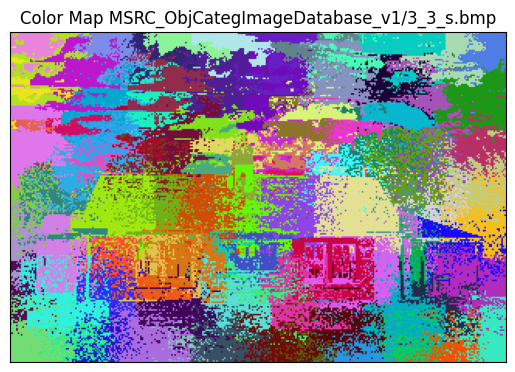

...

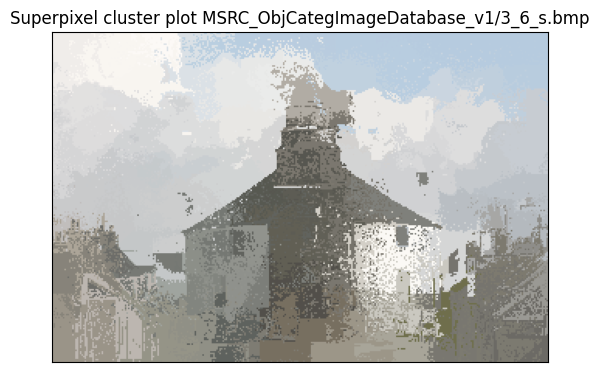

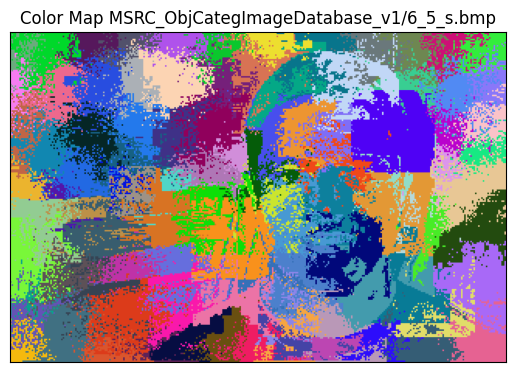

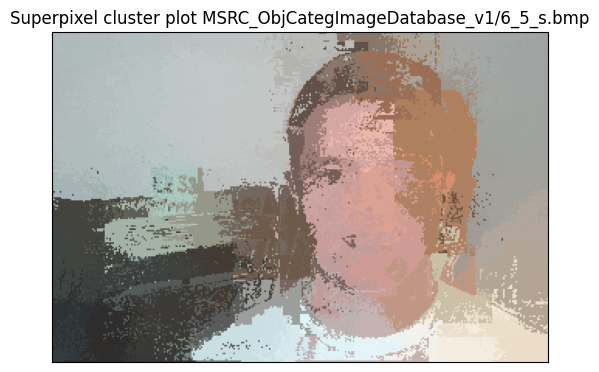

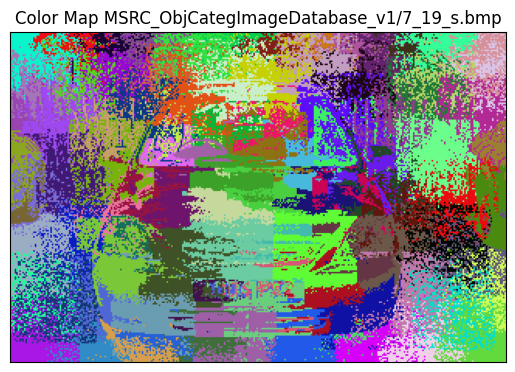

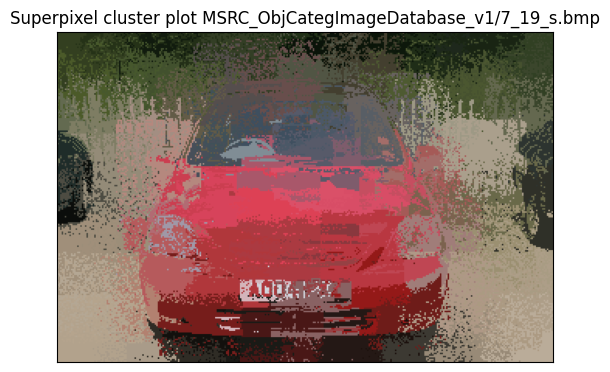

In [ ]:
## TODO: Call our plot functions with your SLIC results for all 6 images
super_pixel_segmap = []
for i in im_list:
    im = cv2.imread(i)
    clusters = SLIC(im,fav_k)
    super_pixel_segmap.append(clusters)
    _ = rgb_segment(clusters,n = fav_k, title =  "Color Map " + str(i),legend = False)
    superpixel_plot(im,clusters,title =  "Superpixel cluster plot "+ str(i))

### Question 3: What advantage did the SLIC give compared to `(r, g, b, x, y)`? Please answer in 3 sentences or fewer. (10 points)

Your Answer:
The first advantage of SLIC over (r,g,b,x,y) is that SLIC operates in LAB space which is more perceptually uniform than RGB space. LAB space helps in showing color differences verywell even with small change in color. Another advantage of SLIC is the distance computation formula which considers spatial and color distances between pixels. This is better than RGB where we group pixels by Kmeans which are random clusters

### Bonus Question 4: Enforce connectivity (20 points, OPTIONAL)
There are many superpixels which are very small and disconnected from each other. Merge them with larger superpixels

O(N) algorithm:
1. Set minimum size of superpixel
2. If region smaller than threshold, assign to nearest cluster

Plot results for the 6 images.


<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)


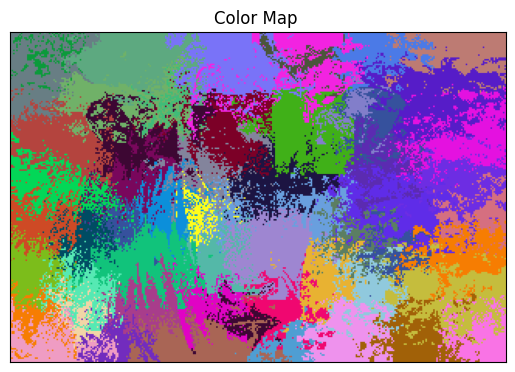

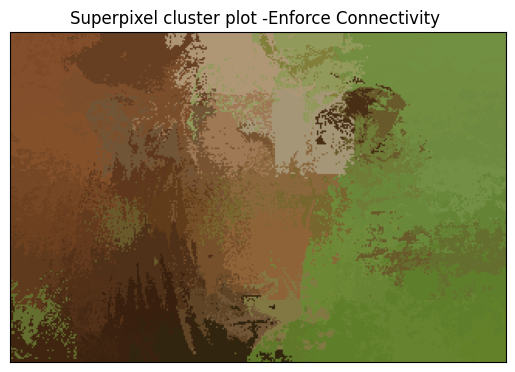

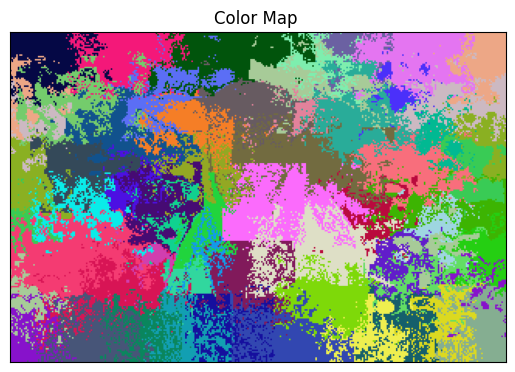

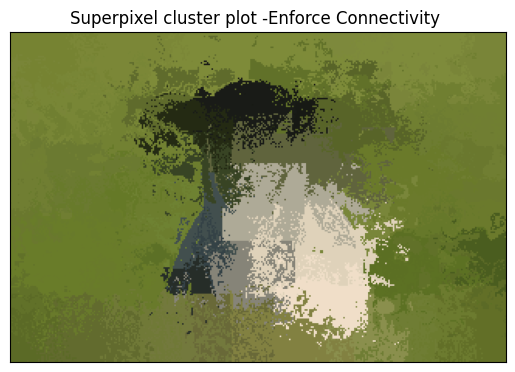

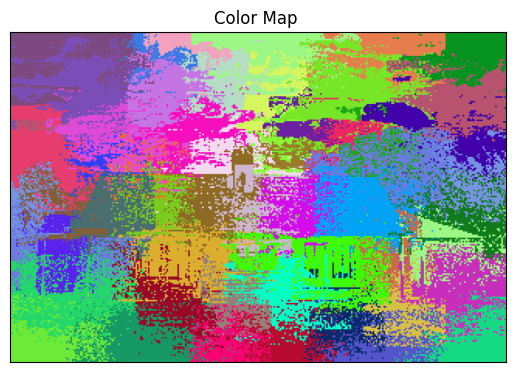

...

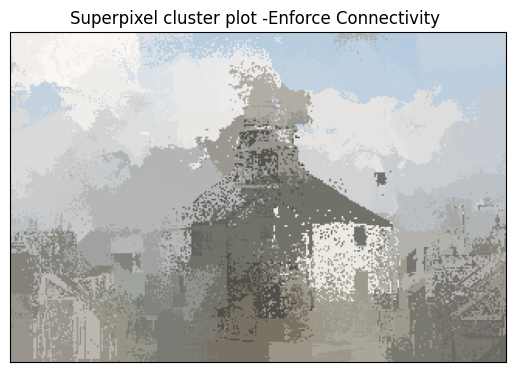

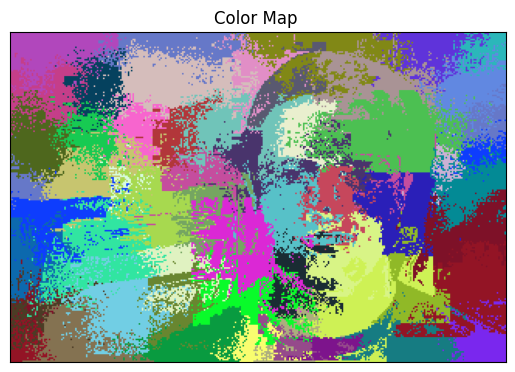

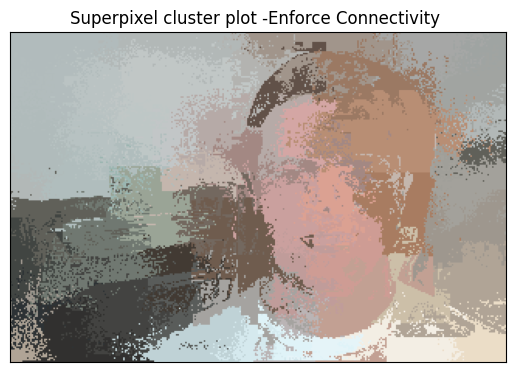

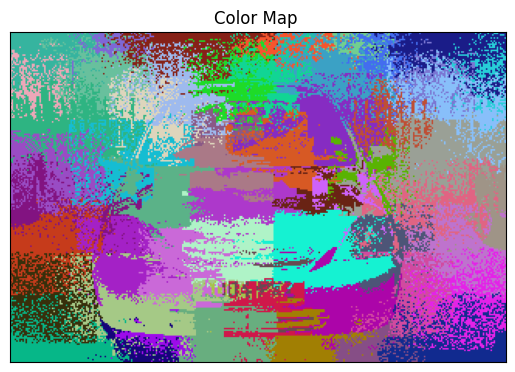

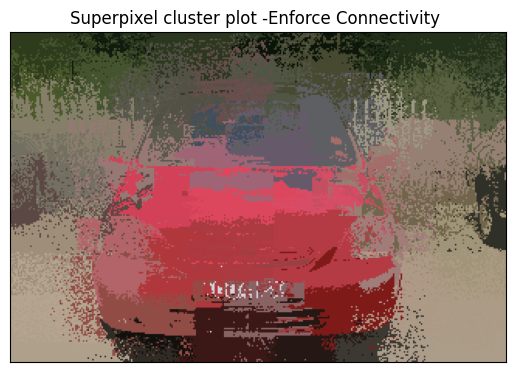

In [ ]:
for i in range(len(super_pixel_segmap)):
  current_image = super_pixel_segmap[i]
  current_unique_labels = np.unique(current_image)
  labels =[]
  pixel_count = []
  for unique in current_unique_labels:
    pixel_indices = np.where(current_image==unique)
    pixels_for_labels = list(zip(pixel_indices[0],pixel_indices[1]))
    label_i_pixel_count = len(pixels_for_labels)
    labels.append(unique)
    pixel_count.append(label_i_pixel_count)
  updated_label_values ={}
  for count in range(len(pixel_count)):
    if (pixel_count[count] < 750):
      if (count == 0 ):
        nearest_pixels_max = max(pixel_count[count:count+2])
        max_index = pixel_count.index(nearest_pixels_max)
        updated_label_values[labels[count]]= labels[max_index]
      elif (count==len(pixel_count)):
        nearest_pixels_max = max(pixel_count[count-2:count])
        max_index = pixel_count.index(nearest_pixels_max)
        updated_label_values[labels[count]]= labels[max_index]
      else:
        nearest_pixels_max = max(pixel_count[count-1:count+2])
        max_index = pixel_count.index(nearest_pixels_max)
        updated_label_values[labels[count]]= labels[max_index]
    else:
      updated_label_values[labels[count]]= labels[count]
  rows,columns = current_image.shape
  for row in range(rows):
    for column in range(columns):
      current_image[row,column] = updated_label_values[current_image[row,column]]
  _ = rgb_segment(current_image,n = fav_k, title =  "Color Map ",legend = False)
  img_read = cv2.imread(im_list[i])
  superpixel_plot(img_read,current_image,title =  "Superpixel cluster plot -Enforce Connectivity ")





## Part 2: Segmentation

For this part, you will use your best superpixels to build an image segmentation system. Alternatively, you can use SLIC from some library, as we demonstrate in the Data section that follows.

### Data

This is mostly the same as the last part, except now we also need to consider the annotated ground truth segmentation maps.

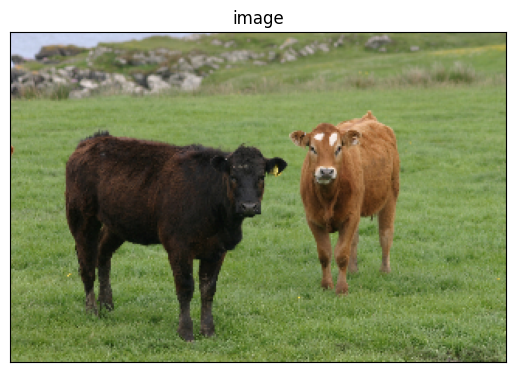

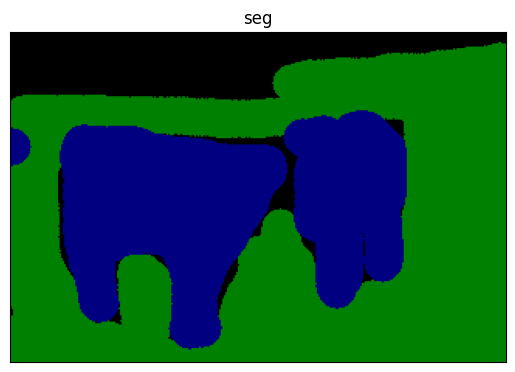

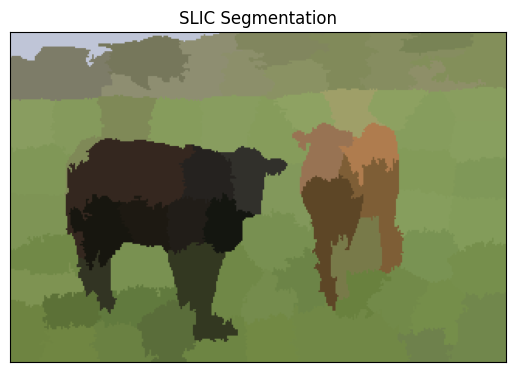

In [ ]:
#  plot a sample image and its ground truth segments
image_sample = cv2.imread('MSRC_ObjCategImageDatabase_v1/1_19_s.bmp')
seg_sample = cv2.imread('MSRC_ObjCategImageDatabase_v1/1_19_s_GT.bmp')
plot_image(image_sample, 'image')
plot_image(seg_sample, 'seg')

#  run SLIC on the sample image and plot the corresponding SLIC segments
from skimage.segmentation import slic

segments_sample = slic(image_sample, n_segments=100, compactness=10)
superpixel_plot(image_sample, segments_sample, title = "SLIC Segmentation")

In [ ]:
from IPython import embed
import os
current_directory = os.getcwd()
msrc_directory = current_directory + '/MSRC_ObjCategImageDatabase_v1'

#Superpixel dataset preparation

# from Dataset_v1
SEG_LABELS_LIST_v1 = [
    {"id": 9, "name": "void",       "rgb_values": [0,   0,    0]},
    {"id": 0,  "name": "building",   "rgb_values": [128, 0,    0]},
    {"id": 1,  "name": "grass",      "rgb_values": [0,   128,  0]},
    {"id": 2,  "name": "tree",       "rgb_values": [128, 128,  0]},
    {"id": 3,  "name": "cow",        "rgb_values": [0,   0,    128]},
    {"id": 4,  "name": "sky",        "rgb_values": [128, 128,  128]},
    {"id": 5,  "name": "airplane",   "rgb_values": [192, 0,    0]},
    {"id": 6, "name": "face",       "rgb_values": [192, 128,  0]},
    {"id": 7, "name": "car",        "rgb_values": [64,  0,    128]},
    {"id": 8, "name": "bicycle",    "rgb_values": [192, 0,    128]},
    {"id": 9, "name": "horse",       "rgb_values": [128,   0,    128]},
    {"id": 9, "name": "water",       "rgb_values": [64,   128,    0]},
    {"id": 9, "name": "mountain",       "rgb_values": [64,   0,    0]},
    {"id": 9, "name": "sheep",       "rgb_values": [0,   128,    128]}]

# from Dataset_v2
SEG_LABELS_LIST_v2 = [
    {"id": -1, "name": "void",       "rgb_values": [0,   0,    0]},
    {"id": 0,  "name": "building",   "rgb_values": [128, 0,    0]},
    {"id": 1,  "name": "grass",      "rgb_values": [0,   128,  0]},
    {"id": 2,  "name": "tree",       "rgb_values": [128, 128,  0]},
    {"id": 3,  "name": "cow",        "rgb_values": [0,   0,    128]},
    {"id": 4,  "name": "horse",      "rgb_values": [128, 0,    128]},
    {"id": 5,  "name": "sheep",      "rgb_values": [0,   128,  128]},
    {"id": 6,  "name": "sky",        "rgb_values": [128, 128,  128]},
    {"id": 7,  "name": "mountain",   "rgb_values": [64,  0,    0]},
    {"id": 8,  "name": "airplane",   "rgb_values": [192, 0,    0]},
    {"id": 9,  "name": "water",      "rgb_values": [64,  128,  0]},
    {"id": 10, "name": "face",       "rgb_values": [192, 128,  0]},
    {"id": 11, "name": "car",        "rgb_values": [64,  0,    128]},
    {"id": 12, "name": "bicycle",    "rgb_values": [192, 0,    128]},
    {"id": 13, "name": "flower",     "rgb_values": [64,  128,  128]},
    {"id": 14, "name": "sign",       "rgb_values": [192, 128,  128]},
    {"id": 15, "name": "bird",       "rgb_values": [0,   64,   0]},
    {"id": 16, "name": "book",       "rgb_values": [128, 64,   0]},
    {"id": 17, "name": "chair",      "rgb_values": [0,   192,  0]},
    {"id": 18, "name": "road",       "rgb_values": [128, 64,   128]},
    {"id": 19, "name": "cat",        "rgb_values": [0,   192,  128]},
    {"id": 20, "name": "dog",        "rgb_values": [128, 192,  128]},
    {"id": 21, "name": "body",       "rgb_values": [64,  64,   0]},
    {"id": 22, "name": "boat",       "rgb_values": [192, 64,   0]}]

# create a map rgb_2_label, where mapping the ground truth 3-d array segmentation into a single ID label.
rgb_2_label = {}
for i in SEG_LABELS_LIST_v1:
    rgb_2_label[tuple(i['rgb_values'])] = i['id']
label_2_rgb = {}
for i in SEG_LABELS_LIST_v1:
  label_2_rgb[i['id']] = tuple(i['rgb_values'])


### Question 5: Superpixel Dataset (30 points)

First, we dilate each superpixel and save the output superpixel patch from SLIC into 224X224 size image (after rescaling), alongwith the ground truth segments label.

For the purpose of consistency, we adopt the existing SLIC implementation from the scikit-learn machine learning package.

Suggested algorithm: Save the superpixels along with their segmentation class. You could implement this as follows:

For each image
1. Get superpixels sp_i for image x. We adopt 100 segments in this assignment, 'segments = slic(image, n_segments=100, compactness=10)'.
2. For every superpixel sp_i in the image, \\
    2.1. find the smallest rectangle which can enclose sp_i <br>
    2.2. Dilate the rectangle by 3 pixels.<br>
    2.3. Get the same region from the segmentation image (from the file with similar name with *_GT). The class for this sp_i is mode of segmentation classes in that same region. Save the dilated region as npy (jpg is lossy for such small patches).<br>


Alternatively, you could create a single csv with columns segment patch location, class label for each sp_i of each image.<br>italicized text

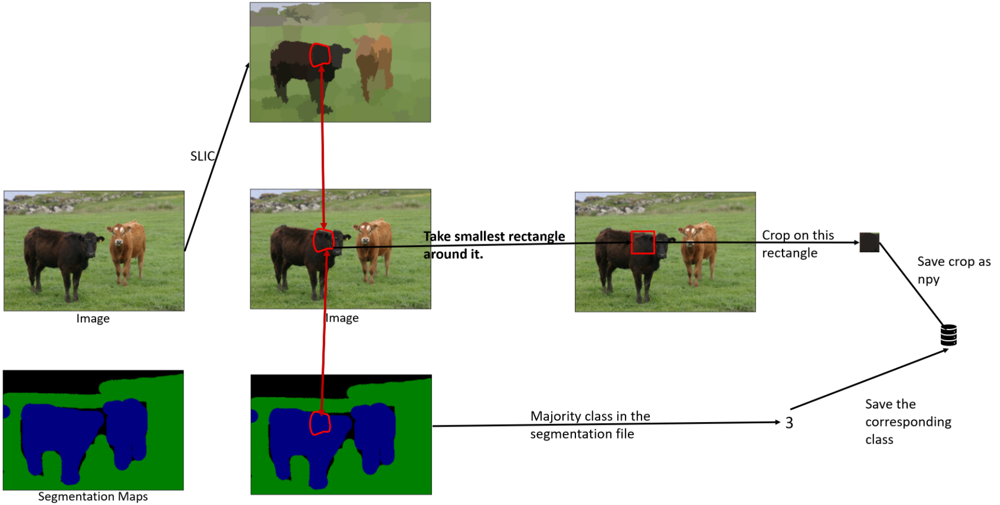


In addition to your code, **the primary graded deliverables** for this question are the 12 demo images we request after you have written code for the dataset.

In [ ]:
from IPython.core.application import default
# run SLIC on each original images and save the (segment patch, ID label) pair
# segments = slic(image, n_segments=100, compactness=10)
# it may take up to half an hour to process, depending on the hardware resources
# save the output file names to train.txt
# Alternatively, you don't save the segment patch and ID label offline, instead,
# you process them on the fly later.

# if os.path.exists('./datasets/train.txt'):
#     os.remove('./datasets/train.txt')
import pandas as pd
import cv2
from skimage.segmentation import slic
from skimage.measure import regionprops
import shutil
ground_truth_imgs_filenames =[]
real_imgs_filenames = []

#Creation of directories for saving cropped superpixel patches and csv data
cropped_imgs_directory = msrc_directory+"/cropped_imgs_directory"
try:
    shutil.rmtree(cropped_imgs_directory)
except OSError as e:
    pass
if not os.path.exists(cropped_imgs_directory):
  os.mkdir(cropped_imgs_directory)

csv_data_directory = msrc_directory+"/csv_data"
try:
    shutil.rmtree(csv_data_directory)
except OSError as e:
    pass
if not os.path.exists(csv_data_directory):
  os.mkdir(csv_data_directory)

# Appending file names into different lists . One for original image and one for segmented ground truth image
for filename in os.listdir(msrc_directory):
    # Your code
    a = filename.split(".")
    last_two_char_extraction = a[0][len(a[0])-2:]
    if(last_two_char_extraction == 'GT'):
      ground_truth_imgs_filenames.append(".".join(a))
    elif (a[0][-1] == "s"):
      real_imgs_filenames.append(".".join(a))

# Used to save patch segment filename and its associated label. later converted to csv
patch_vs_labels = []

'''
The below function calculates the dilated coordinates, taking the bounding box coordinates which
are minimum and maximum values of the each superpixel along x and y direction of the image
'''
def get_dilated_coords(bounding_box_coords,seg_sample):
  height,width = seg_sample.shape
  x_min,y_min,x_max,y_max = bounding_box_coords
  #no of pixels to dilate
  pixel_dilate = 3
  # Dilated the coordinates of the rectangle by no of pixels to dilate given above. Constraining the min max values to stay in the image shape
  x_min = max(0,x_min-pixel_dilate)
  x_max = min(height, x_max+pixel_dilate)
  y_min = max(0,y_min-pixel_dilate)
  y_max = min(width, y_max+pixel_dilate)
  return [x_min,y_min,x_max,y_max]
'''
The below function gets the bounding box coordinates for each superpixel segment from slic
'''
def get_bbox_coords(unique,seg_sample):
  pixels_for_labels = np.where(seg_sample == unique)
  pixels_for_labels = np.array(list(zip(pixels_for_labels[0],pixels_for_labels[1])))
  x_max,y_max = np.max(pixels_for_labels,axis = 0)
  x_min,y_min = np.min(pixels_for_labels,axis = 0)
  return [x_min,y_min,x_max+1,y_max+1]
'''
The function below is used to crop the image with the bounding box coordinates we have
'''
def crop_image(dilated_coords,im_read):
    #cropping the patch using dilated coords
    x_min,y_min,x_max,y_max = dilated_coords
    patch = im_read[x_min:x_max+1,y_min:y_max+1,:]
    return patch
'''
The function below is used to compare the ground truth segment patch and the given
dataset to determine the label for the segmented patch
'''
def get_segment_gt_label(gt_cropped_patch):
  label_count_dict = {}
  h , w = gt_cropped_patch.shape[0] ,gt_cropped_patch.shape[1]
  for i in range(h):
    for j in range(w):
      segment_patch_color = tuple(gt_cropped_patch[i,j])
      label = rgb_2_label.get(segment_patch_color, -1)
      if label not in label_count_dict.keys():
        label_count_dict[label] = 1
      else:
        label_count_dict[label] += 1
  seg_label = max(label_count_dict, key=label_count_dict.get)
  return seg_label,label_2_rgb[seg_label]

for i in range(len(real_imgs_filenames)):
  # Take the original image path conver to rgb
  img_path = msrc_directory+"/"+real_imgs_filenames[i]
  im_read = cv2.imread(img_path)
  im_read = cv2.cvtColor(im_read,cv2.COLOR_BGR2RGB)
  #find slic segment labels
  seg_sample = slic(im_read, n_segments=100, compactness=10)
  # super_pixel_regions = regionprops(seg_sample)
  # for _,region in enumerate(super_pixel_regions):
  #   print("from sklearn",region.bbox)
  # Get list of unique labels
  unique_labels = np.unique(seg_sample)
  # Get the ground truth image
  gt_img_path = msrc_directory + "/" + real_imgs_filenames[i].split(".")[0] + "_GT.bmp"
  gt_img_read = cv2.imread(gt_img_path)
  gt_img_read = cv2.cvtColor(gt_img_read,cv2.COLOR_BGR2RGB)
  for unique in range(len(unique_labels)):
    # print(unique)
    bounding_box_coords = get_bbox_coords(unique_labels[unique],seg_sample)
    dilated_coords = get_dilated_coords(bounding_box_coords,seg_sample)
    # print("bbox",bounding_box_coords)
    # print("dilated", dilated_coords)
    cropped_patch = crop_image(dilated_coords,im_read)
    # gt_label_status = []
    gt_cropped_patch = crop_image(dilated_coords,gt_img_read)
    # values, counts = np.unique(gt_cropped_patch.reshape(-1,3), axis = 0, return_counts= True)
    # Getting the segment label and rgb value
    gt_patch_segment_label,rgb_value = get_segment_gt_label(gt_cropped_patch)
    # resizing the image as requested
    cropped_patch_resize = cv2.resize(cropped_patch,(224,224),interpolation = cv2.INTER_AREA)
    gt_patch_resize = cv2.resize(gt_cropped_patch,(224,224),interpolation = cv2.INTER_AREA)
    # plot_image(cropped_patch_resize,title="cropped")
    # plot_image(gt_patch_resize,title=f"gt_patch,{gt_patch_segment_label},{rgb_value}")
    cropped_patch_filepath_i = cropped_imgs_directory + "/" + real_imgs_filenames[i].split(".")[0] + str(unique)+".npy"
    # Saving the cropped image of superpixels for each image
    np.save(cropped_patch_filepath_i,cropped_patch_resize)
    patch_vs_labels.append([real_imgs_filenames[i].split(".")[0] + str(unique)+".npy",gt_patch_segment_label])

# Creation of csv data for mapping cropped patch vs its correct label from ground truth labels
segmented_csv_data = pd.DataFrame(patch_vs_labels, columns = ["segment_patch_loc","label_id"])
segmented_csv_data.to_csv(csv_data_directory+"/segmented_csv_data.csv")


In [ ]:
#CSV_Dataset split into training and test
import csv
import random
csv_file = csv_data_directory+"/segmented_csv_data.csv"
training_csv = csv_data_directory+"/training_data.csv"
testing_csv = csv_data_directory+"/test_data.csv"

with open(csv_file,'r') as input_file:
  read = csv.reader(input_file)
  #ignore head
  header = next(read)
  header.pop(0)
  data = []
  for row in read:
    data.append(row[1:])

# Random shuffling of the patch data
random.shuffle(data)
# 80% of data for training
train_split_size = int(0.8 * len(data))
#20% data for test
test_split_size = len(data) - train_split_size  # Remaining for the second part

# Split the data into two parts
train_split = data[:train_split_size]
test_split = data[train_split_size:]

# Write the two parts to separate CSV files
with open(training_csv, 'w', newline='') as file1:
    csv_writer1 = csv.writer(file1)
    csv_writer1.writerow(header)
    csv_writer1.writerows(train_split)

with open(testing_csv, 'w', newline='') as file2:
    csv_writer2 = csv.writer(file2)
    csv_writer2.writerow(header)
    csv_writer2.writerows(test_split)


In [ ]:
import os
import numpy as np
import torch
import torch.utils.data as data
from PIL import Image
from torchvision import transforms
import _pickle as pickle
import torch.nn as nn
import torchvision.models as models
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau


cuda_available = torch.cuda.is_available()
if (cuda_available):
  print("Using CUDA")
device = torch.device("cuda" if cuda_available else "cpu")
print(device)
# -------------
# Dataset class
# -------------
#
# ``torch.utils.data.Dataset`` is an abstract class representing a
# dataset.
# Your custom dataset should inherit ``Dataset`` and override the following
# methods:
#
# -  ``__len__`` so that ``len(dataset)`` returns the size of the dataset.
# -  ``__getitem__`` to support the indexing such that ``dataset[i]`` can
#    be used to get sp_i sample
#
# Let's create a dataset class for our superpixel dataset. We will
# read the csv in ``__init__`` but leave the reading of images to
# ``__getitem__``. This is memory efficient because all the images are not
# stored in the memory at once but read as required.
#
# Sample of our dataset will be a dict
# ``{'superpixel image': image, 'superpixel class': class}``. Our dataset will take an
# optional argument ``transform`` so that any required processing can be
# applied on the sample. Remember to resize the image using ``transform``.

class SegmentationData(data.Dataset):

    def __init__(self,directory_path,csv_path,transform = None):

        # Your code
        self.data = pd.read_csv(f'{csv_path}',skiprows = 1, header =  None)
        self.dataset_size = len(self.data)
        self.dataset_path = directory_path
        self.transform = transform


    def __len__(self):
        # Your code
        return self.dataset_size


    def __getitem__(self, index):
        # Your code
        #The patch filename
        patch_filename = self.data.iloc[index,0]
        image_path = f'{self.dataset_path}/{patch_filename}'
        image_read = np.load(image_path,allow_pickle=True)
        seg_label = int(self.data.iloc[index,1])
        tensor_label = torch.tensor(seg_label)
        if(self.transform):
          image =  self.transform(image_read)
        return (image,seg_label)


Using CUDA
cuda


Show some outputs! Choose 1 image. For that image, plot the image, along with the superpixel map for the image, as you did for Assignment 1. Then, show the first 10 superpixel patches for the image, retrieved from your dataset.

The output for this portion will be 12 images, displayed below your code below.

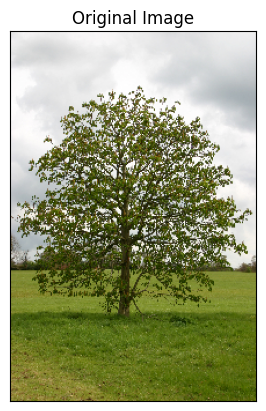

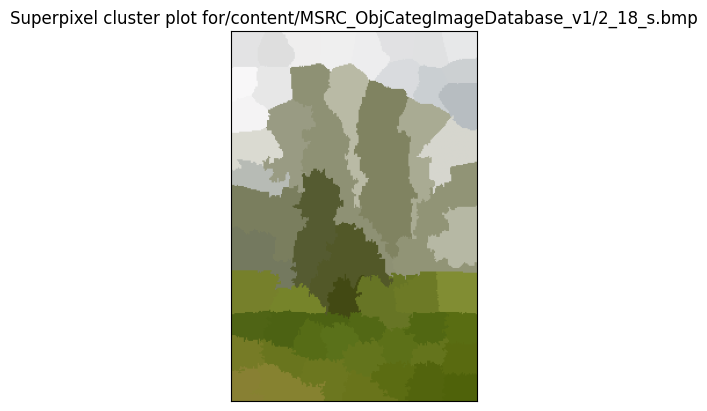

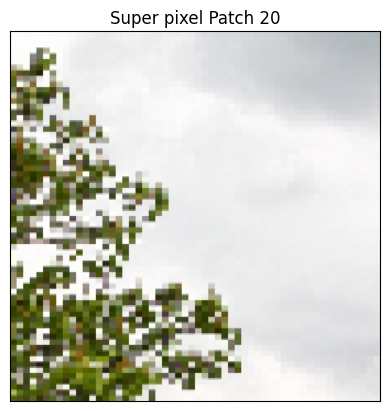

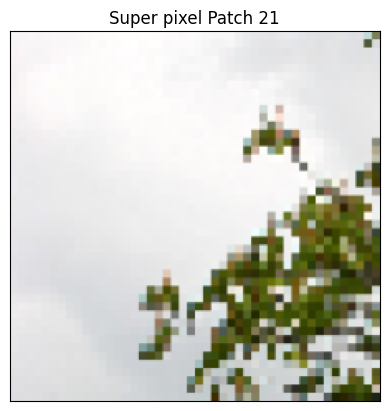

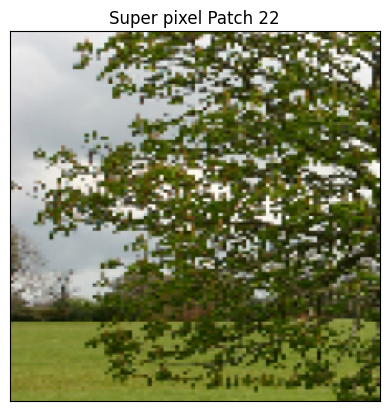

...

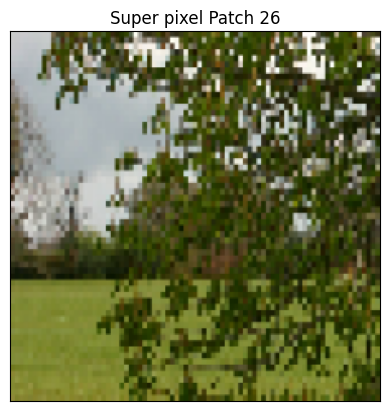

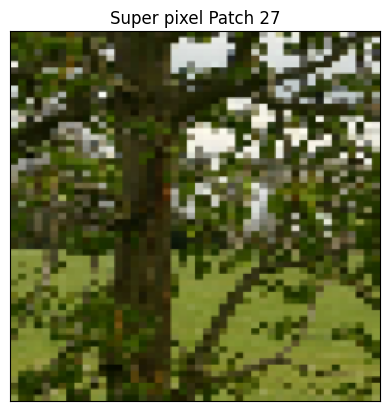

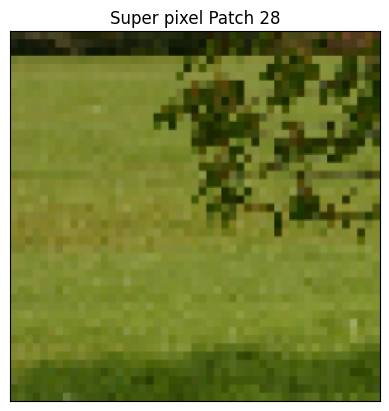

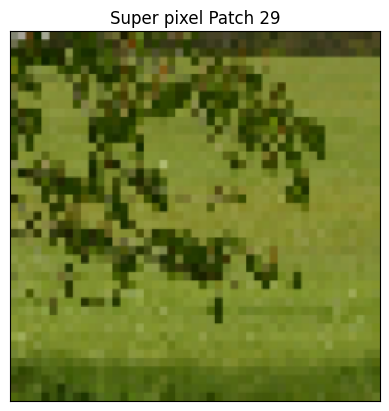

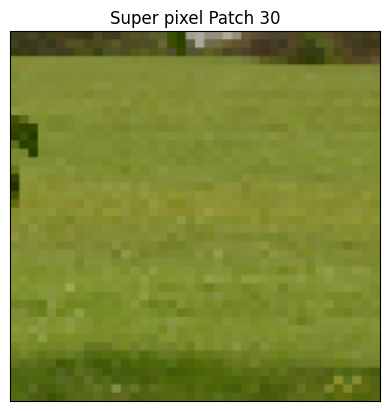

In [ ]:
### YOUR CODE TO PLOT 12 images (original RGB + superpixel map + first 10 superpixels) ###

#Plotting the original Image
file = msrc_directory+  "/" + "2_18_s.bmp"
orginial_image = cv2.imread(file)
# original_image_rgb = cv2.cvtColor(original_image,cv2.BGR2RGB)
plot_image(orginial_image,title='Original Image')

#Plotting superpixels for above image
segmap = slic(orginial_image, n_segments=100, compactness=10)
superpixel_plot(orginial_image,segmap,title =  "Superpixel cluster plot for"+ str(file))

#Plotting of first 10 patches for the image
file_patch_path = cropped_imgs_directory+  "/" + "2_18_s"
for i in range(20,31,1):
  patch_i_path = file_patch_path+ str(i) + ".npy"

  patch_i = np.load(patch_i_path)

  plot_image(patch_i,title=f'Super pixel Patch {i}',isCv2= False)

### Question 6: Deep Network (10 points)

You could use a pre-trained network (like VGG) and replace the last few layers with a fully connected layer.

In [ ]:
# Model definition
from tqdm import tqdm
import time
def load_vgg_model():
  vgg_model = models.vgg16(pretrained = True)
  for parameter in vgg_model.features.parameters():
    parameter.requires_grad =  False
  inputs = vgg_model.classifier[6].in_features
  # We have 10 labels in our datasetv1. The -1 have been changed to 9 since torch is not accepting
  outputs = 10
  vgg_model.classifier[6] = nn.Sequential(nn.Linear(inputs,256),
                                    nn.ReLU(inplace=True),
                                    nn.Dropout(0.5),
                                    nn.Linear(256,outputs)
                                    )
  return vgg_model

class SegmentationNN(nn.Module):
    def __init__(self):
        super(SegmentationNN,self).__init__()
        self.model = load_vgg_model()
        self.model.to(device)
        print(self.model)



    def forward(self,x):
        # Your code
        x = self.model(x)
        return x


### Question 7: Optimizer (10 points)

Finally, we define the classification loss and optimizer such that we can learn a superpixel classifier from the backproporgation algorithm.

In [ ]:
# Optimizer
NUM_EPOCHS = 9
class Solver(object):
    def __init__(self,model,learning_rate = 0.00001):
        # Your code
        self.model = model
        self.loss = nn.CrossEntropyLoss()
        self.optimizer = torch.optim.Adam(model.parameters(),lr = learning_rate)
        self.scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(self.optimizer,factor = 0.1,patience= 5,verbose=True)

        self.training_accuracy_epochs = []
        self.training_loss_epochs = []
        self.current_loss = []
        self.current_accuracy = []
        self.validate_accuracy_epochs =[]
        self.validate_loss_epochs = []

    def train(self,dataloader):
        self.model.train()
        start = time.process_time()
        self.accuracy_epochs = []
        self.loss_epochs =[]
        self.current_loss = []
        self.current_accuracy = []

        for epoch in range(NUM_EPOCHS+1):
          loss = []
          current_accuracy = 0
          num_samples = 0
          current_batch = tqdm(enumerate(dataloader) , total = len(dataloader), leave = False)
          for idx, (patch_image,labels) in current_batch:
            patch_image = patch_image.to(device = device)
            labels = labels.to(device = device)

            predicted_labels = self.model(patch_image)

            _, predictions = torch.max(predicted_labels,1)
            # Getting cross entropy loss
            loss_batch = self.loss(predicted_labels,labels)
            current_batch_loss = loss_batch.item()
            loss.append(current_batch_loss)

            #Accuracy calculations
            current_accuracy += torch.sum(predictions == labels)
            num_samples += predicted_labels.size(0)
            current_batch_accuracy = (current_accuracy/num_samples).item()
            # Optimizer call
            self.optimizer.zero_grad()
            loss_batch.backward()
            self.optimizer.step()
            current_batch.set_description(f"Current Running Epoch: {epoch} / {NUM_EPOCHS}")
            current_batch.set_postfix( loss =current_batch_loss, accuracy = current_batch_accuracy )
            self.current_loss.append(sum(loss) / len(loss))
          avg_loss_epoch = sum(loss) / len(loss)
          epoch_accuracy = current_accuracy / num_samples

          self.scheduler.step(avg_loss_epoch)
          self.training_accuracy_epochs.append(epoch_accuracy)
          self.training_loss_epochs.append(avg_loss_epoch)

          stop_time = time.process_time()
          total_time = stop_time - start
          total_time_minutes = total_time//60
          total_time_secs = total_time % 60

          print(f'Epoch:[{epoch} / {NUM_EPOCHS}];Time:{total_time_minutes} min {total_time_secs} secs;Training Loss:{avg_loss_epoch:.4f};Accuracy:{epoch_accuracy:.4f}')
    def evaluate_model(self,dataloader):
      self.model.eval()
      start = time.process_time()
      self.validate_accuracy_epochs = []
      self.validate_loss_epochs = []
      self.loss_epochs =[]
      self.loss = []
      self.current_accuracy = []

      for epoch in range(NUM_EPOCHS+1):
        loss = []
        current_accuracy = 0
        num_samples = 0
        current_batch = tqdm(enumerate(dataloader) , total = len(dataloader), leave = True)
        with torch.no_grad():
          for idx, (patch_image,labels) in current_batch:
            patch_image = patch_image.to(device = device)
            labels = labels.to(device = device)

            predicted_labels = self.model(patch_image)
            _, predictions = torch.max(predicted_labels,1)
            #Accuracy calculations
            current_accuracy += torch.sum(predictions == labels)
            num_samples += predicted_labels.size(0)
            current_batch_accuracy = (current_accuracy/num_samples).item()
            current_batch.set_description(f"Epoch: {epoch} / {NUM_EPOCHS}")
            current_batch.set_postfix(accuracy = current_batch_accuracy )
        self.validate_accuracy_epochs.append(current_accuracy/num_samples)
        stop_time = time.process_time()
        total_time = stop_time - start
        total_time_minutes = total_time//60
        total_time_secs = total_time % 60
        print(f'Epoch:[{epoch} / {NUM_EPOCHS}];Time:{total_time_minutes} min {total_time_secs} secs; Validation Accuracy:{current_accuracy/num_samples:.4f}')








### Question 8: Putting it together (50 points)

Train your network and observe the loss in time.
During the inference stage, combine the SLIC Superpixels' predicted labels to form the whole input image's superpixel segmentation results.
The following 4 items are the primary graded components:

1. You must randomly split the whole dataset into train and test subset (80:20 split is fine).
2. You must show the training loss of the classifier after every epoch
3. You must show the training accuracy and test accuracy of the classifier after training.
4. You must plot as least one visualization showing the test segmentation map vs. ground truth segmentation map.

In [ ]:
batchsize = 16
# load the data
# #Creating transformations such as Data Augmentation. Taking transform normalized values of imagenet
norm1= [0.485,0.456,0.406]
norm2 = [0.229,0.224,0.225]
transformations = transforms.Compose([transforms.ToPILImage(),transforms.Resize((224,224)),transforms.ToTensor(),transforms.Normalize(norm1,norm2)])

#Dataset Directory Loader
patch_image_data_directory = cropped_imgs_directory
training_csv_data_file_path = training_csv
testing_csv_data_file_path = testing_csv
dataset_train = SegmentationData(patch_image_data_directory,training_csv_data_file_path,transformations)
dataset_test = SegmentationData(patch_image_data_directory,testing_csv_data_file_path,transformations)

# data loader
training_data_loader = data.DataLoader(dataset=dataset_train,batch_size = batchsize,shuffle=True,num_workers = 2)
test_data_loader = data.DataLoader(dataset=dataset_test,batch_size = batchsize,shuffle=True,num_workers = 2)
iter_sample = iter(training_data_loader)
print(next(iter_sample)[0][0].shape)
# model
model = SegmentationNN()
print("Model Loading Finished")
# train the model
learning_rate = 0.0001
solver_model = Solver(model,learning_rate)


torch.Size([3, 224, 224])


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 274MB/s]


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
solver_model.train(training_data_loader)
print("-------------Training Finished-----------------------")

Epoch:[0 / 9];Time:1.0 min 11.415371376999929 secs;Training Loss:0.8177;Accuracy:0.7164


Epoch:[1 / 9];Time:2.0 min 28.09502403299996 secs;Training Loss:0.4269;Accuracy:0.8468


Epoch:[2 / 9];Time:3.0 min 47.55161293799995 secs;Training Loss:0.2577;Accuracy:0.9102


Epoch:[3 / 9];Time:5.0 min 6.519039068999973 secs;Training Loss:0.1683;Accuracy:0.9428


Epoch:[4 / 9];Time:6.0 min 25.873488674999976 secs;Training Loss:0.1187;Accuracy:0.9601


Epoch:[5 / 9];Time:7.0 min 45.470522231999894 secs;Training Loss:0.0935;Accuracy:0.9673


Epoch:[6 / 9];Time:9.0 min 4.30969660400001 secs;Training Loss:0.0789;Accuracy:0.9739


Epoch:[7 / 9];Time:10.0 min 23.784186898999906 secs;Training Loss:0.0670;Accuracy:0.9781


Epoch:[8 / 9];Time:11.0 min 43.722047062 secs;Training Loss:0.0579;Accuracy:0.9797


Epoch:[9 / 9];Time:13.0 min 2.420131344000083 secs;Training Loss:0.0634;Accuracy:0.9798
-------------Training Finished-----------------------


In [ ]:
training_accuracy = solver_model.training_accuracy_epochs
print("The accuracy of training after each epoch:",training_accuracy)
training_loss = solver_model.training_loss_epochs
print("The loss of training after each epoch:",training_loss)

The accuracy of training after each epoch: [tensor(0.7164, device='cuda:0'), tensor(0.8468, device='cuda:0'), tensor(0.9102, device='cuda:0'), tensor(0.9428, device='cuda:0'), tensor(0.9601, device='cuda:0'), tensor(0.9673, device='cuda:0'), tensor(0.9739, device='cuda:0'), tensor(0.9781, device='cuda:0'), tensor(0.9797, device='cuda:0'), tensor(0.9798, device='cuda:0')]
The loss of training after each epoch: [0.8176579163345273, 0.42686015434841784, 0.2577004036801632, 0.16826890240400164, 0.11865475371960806, 0.09351551573333515, 0.07892459680789868, 0.06696297854272254, 0.05786401366377073, 0.06344780966679622]


In [ ]:
solver_model.evaluate_model(test_data_loader)
print("-------------Testing Finished-----------------------")

Epoch: 0 / 9: 100%|██████████| 181/181 [00:16<00:00, 11.15it/s, accuracy=0.826]

Epoch:[0 / 9];Time:0.0 min 13.892879841999957 secs; Validation Accuracy:0.8262



Epoch: 1 / 9: 100%|██████████| 181/181 [00:16<00:00, 11.10it/s, accuracy=0.826]

Epoch:[1 / 9];Time:0.0 min 28.179142131999924 secs; Validation Accuracy:0.8262



Epoch: 2 / 9: 100%|██████████| 181/181 [00:16<00:00, 11.01it/s, accuracy=0.826]

Epoch:[2 / 9];Time:0.0 min 41.98747960599985 secs; Validation Accuracy:0.8262



Epoch: 3 / 9: 100%|██████████| 181/181 [00:16<00:00, 10.97it/s, accuracy=0.826]

Epoch:[3 / 9];Time:0.0 min 55.52582804099984 secs; Validation Accuracy:0.8262



Epoch: 4 / 9: 100%|██████████| 181/181 [00:16<00:00, 11.17it/s, accuracy=0.826]

Epoch:[4 / 9];Time:1.0 min 9.864515300999983 secs; Validation Accuracy:0.8262



Epoch: 5 / 9: 100%|██████████| 181/181 [00:16<00:00, 11.18it/s, accuracy=0.826]

Epoch:[5 / 9];Time:1.0 min 24.115479885000013 secs; Validation Accuracy:0.8262



Epoch: 6 / 9: 100%|██████████| 181/181 [00:16<00:00, 10.98it/s, accuracy=0.826]

Epoch:[6 / 9];Time:1.0 min 38.00509575499996 secs; Validation Accuracy:0.8262



Epoch: 7 / 9: 100%|██████████| 181/181 [00:16<00:00, 11.22it/s, accuracy=0.826]

Epoch:[7 / 9];Time:1.0 min 52.33614930299996 secs; Validation Accuracy:0.8262



Epoch: 8 / 9: 100%|██████████| 181/181 [00:16<00:00, 11.19it/s, accuracy=0.826]

Epoch:[8 / 9];Time:2.0 min 6.583958675999838 secs; Validation Accuracy:0.8262



Epoch: 9 / 9: 100%|██████████| 181/181 [00:16<00:00, 11.18it/s, accuracy=0.826]

Epoch:[9 / 9];Time:2.0 min 20.766641144999994 secs; Validation Accuracy:0.8262
-------------Testing Finished-----------------------


In [ ]:
test_accuracy = solver_model.validate_accuracy_epochs
print("The accuracy of test after each epoch:",test_accuracy)

The accuracy of test after each epoch: [tensor(0.8262, device='cuda:0'), tensor(0.8262, device='cuda:0'), tensor(0.8262, device='cuda:0'), tensor(0.8262, device='cuda:0'), tensor(0.8262, device='cuda:0'), tensor(0.8262, device='cuda:0'), tensor(0.8262, device='cuda:0'), tensor(0.8262, device='cuda:0'), tensor(0.8262, device='cuda:0'), tensor(0.8262, device='cuda:0')]


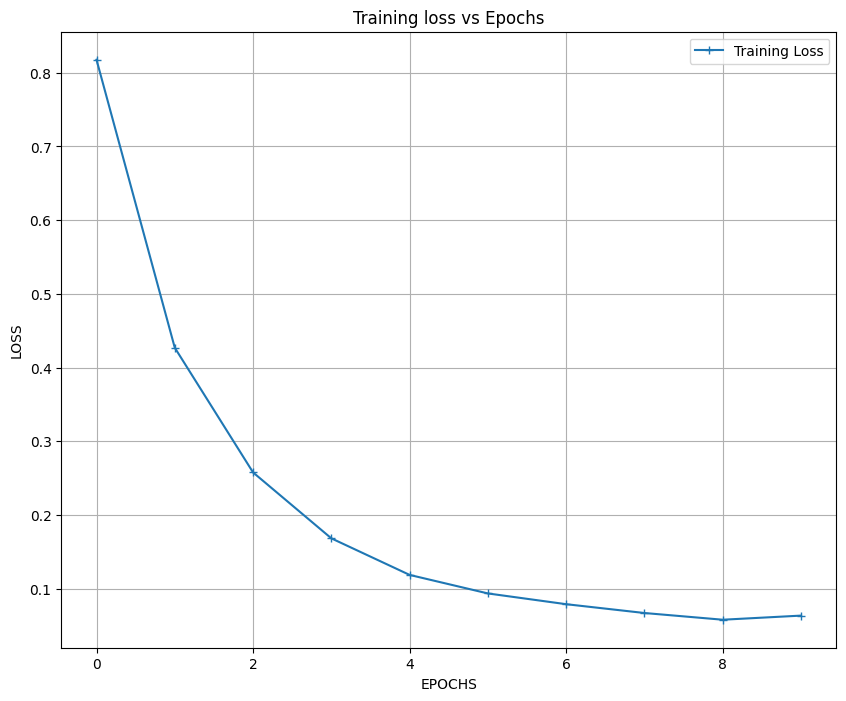

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize= (10,8))
plt.plot(range(0,NUM_EPOCHS+1),training_loss,label = 'Training Loss', marker = '+',linestyle = '-')
plt.xlabel("EPOCHS")
plt.ylabel("LOSS")
plt.title("Training loss vs Epochs")
plt.legend()
plt.grid(True)
plt.show()

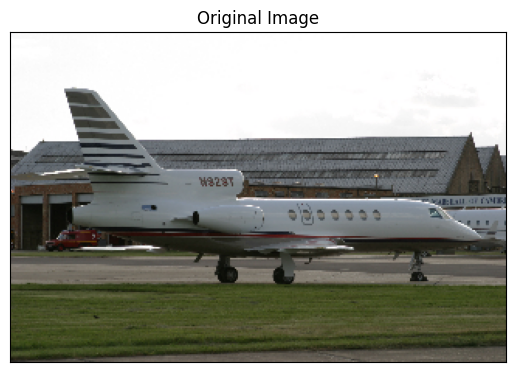

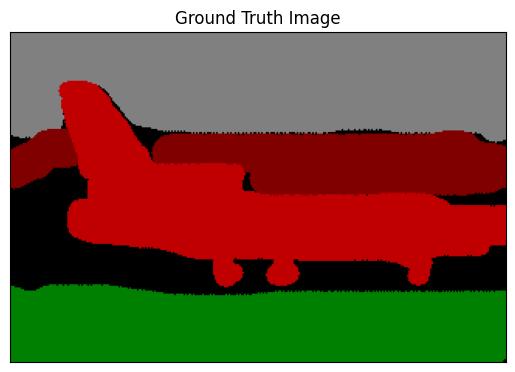

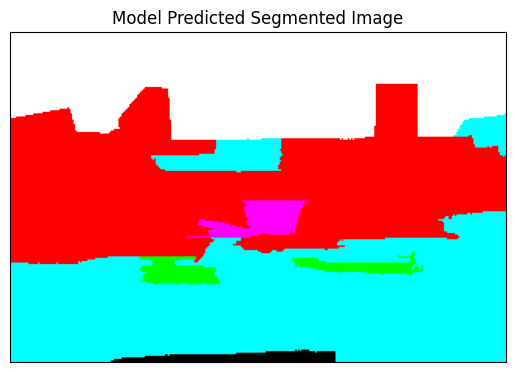

In [ ]:



#taking a random image filename from test_data.csv

image = pd.read_csv(testing_csv,skiprows= 1,header=None)

test_image_name = image.iloc[1000,0].split("s")[0]
test_image_path = msrc_directory +"/" + test_image_name + 's.bmp'
test_image = cv2.imread(test_image_path)
test_image = cv2.cvtColor(test_image,cv2.COLOR_BGR2RGB)

# plt.imshow(test_image)

gt_image_path = msrc_directory +"/" + test_image_name + 's_GT.bmp'
gt_image = cv2.imread(gt_image_path)
gt_image = cv2.cvtColor(gt_image,cv2.COLOR_BGR2RGB)

# plt.imshow(gt_image)
model_predicted_seg_map = np.zeros(test_image.shape)
model_seg_map_class = {}
seg_sample = slic(test_image,n_segments = 100,compactness = 10)
model.eval()

unique_labels = np.unique(seg_sample)
for unique in range(len(unique_labels)):
  bounding_box_coords = get_bbox_coords(unique_labels[unique],seg_sample)
  dilated_coords = get_dilated_coords(bounding_box_coords,seg_sample)
  cropped_patch = crop_image(dilated_coords,im_read)
  if(cropped_patch) is not None:
    cropped_patch_into_model = transformations(cropped_patch).to(device)
    cropped_patch_into_model = cropped_patch_into_model.unsqueeze(0)
    predicted_labels = model(cropped_patch_into_model)

    _,prediction_values = torch.max(predicted_labels,1)
    model_seg_map_class[unique] = prediction_values.item()

    indices = (seg_sample == unique)
    model_predicted_seg_map[indices] = label_2_rgb[prediction_values.item()]
plot_image(test_image, title="Original Image",isCv2= False)
plot_image(gt_image, title="Ground Truth Image",isCv2= False)
plot_image(model_predicted_seg_map, title="Model Predicted Segmented Image",isCv2= False)

### Question 9: Bonus Question (20 points, OPTIONAL):

IMPORTANT: No matter which option you choose, you can earn a maximum of 20 points for this section.

We always want to increase the classifier accuracy and achieve a better performance by building a complicated deep learning model. There are a lot of tricks which are very popular and work in practice. Try to implement either of following two,

1. Could you effictively fuse different deep features from multiple layers in your network? You are welcome to use the pretrained network. Does your network achieve a better accuracy? There are a lot of exploration in the literature, including ION (Inside-Outside Net) [1], Hypercolumns [2], and PixelNet [3]. The following figure illustrates ION architecture combining features from different layers. Can you do similar thing for our Superpixel classifier?

2. Could you build a Multi-resolution network to explore the effectiveness of the multi-scale on the task of Superpixels segmentation? By multi-scale, we mean multiple resolutions of superpixels. See [4] for an example.

[1] Inside-Outside Net: Detecting Objects in Context with Skip Pooling and Recurrent Neural Networks

[2] Hypercolumns for Object Segmentation and Fine-grained Localization

[3] PixelNet: Representationofthe pixels, by the pixels, and for the pixels

[4] Feedforward semantic segmentation with zoom-out features

In [ ]:
# Bonus
